# Use case example for PyHIST

## Objectives
* Build a tissue classifier (convolutional neural network) based on image tiles extracted from WSIs of The Cancer Genome Atlas (TCGA) project. We use a total of 36 WSIs, 6 slides from each of the following tissues: brain (glioblastoma), breast (infiltrating duct carcinoma), colon (adenocarcinoma), liver (clear cell adenocarcinoma), kidney (hepatocellular carcinoma), and skin (malignant melanoma). In this use case, we:
  1. We use __PyHIST__ to segment the WSIs and generate image tiles.
  2. Fit the CNN classifier model using the image tiles.
  3. Isolate feature vectors from the last (fully-connected) layer of the CNN for every tile.
  4. Perform dimensionality reduction (tSNE) and clustering over the feature vectors to identify clusters of tiles that share morphological similarities.

This test case is divided into three notebooks (parts A, B and C). In part A (the current notebook), we will prepare the data using PyHIST. In part B, we will fit the model, and in part C we will analyze the feature vectors.

# Setup
Install the necessary dependencies, and PyHIST.


In [3]:
from IPython.display import Image

# Download necessary dependencies
!brew update
!brew install openslide-tools python3-openslide
#!git clone https://github.com/manuel-munoz-aguirre/PyHIST.git

# To view SVS information
#!apt install imagemagick

# Move to the use case folder
%cd /Users/nima/ComputerVision/ComputerVision/0_Project/PyHIST-master/PyHIST/use_case

==> Updating Homebrew...
Already up-to-date.
==> Searching for similarly named formulae and casks...
==> Formulae
openslide ✔

To install openslide ✔, run:
  brew install openslide ✔

==> Casks
opentoonz

To install opentoonz, run:
  brew install --cask opentoonz
/Users/nima/ComputerVision/ComputerVision/0_Project/PyHIST-master/PyHIST/use_case


Set here the absolute paths (__with a trailing slash__) for the location of PyHIST, and for the folder that contains this notebook.

In [4]:
pyhist_path='/Users/nima/ComputerVision/ComputerVision/0_Project/PyHIST-master/PyHIST/'
tutorial_path='/Users/nima/ComputerVision/ComputerVision/0_Project/PyHIST-master/PyHIST/use_case/'

## Part A - WSI preparation (tile generation with PyHIST)

### Load the required libraries

In [5]:
import numpy as np
import os
import pandas as pd
import shutil
import subprocess as sub
import time

from multiprocessing import Pool
from IPython.display import display
from PIL import Image

### Download the set of images to analyze

Manifest files containing IDs for every image can be obtained directly from TCGA at https://portal.gdc.cancer.gov/repository. Here, we provide a sample of 6 WSIs for each tissue.

In [6]:
# Load the IDs
ids = pd.read_csv('TCGA.txt', sep = '\t')
ids.head()

,id,filename,md5,size,state,Data Category,Data Type,Project ID,Case ID,Sample ID,Sample Type,Tissue,primary_diagnosis
0,925065d2-4c65-41ed-8cf2-f78b3deb8115,TCGA-76-4934-01A-01-TS1.37a9c5e6-3cb3-4d55-909...,074be51c2fd5394c8e5f218572021172,165601441,validated,Biospecimen,Slide Image,TCGA-GBM,TCGA-76-4934,TCGA-76-4934-01A,Primary Tumor,Brain,Glioblastoma
1,6151fa16-50e0-4a2e-aa5c-c27b8ce35efa,TCGA-76-6193-01A-01-TS1.3363a9fa-7731-4da9-9ef...,110546e08baa48ff082a079449f9f76e,107248381,validated,Biospecimen,Slide Image,TCGA-GBM,TCGA-76-6193,TCGA-76-6193-01A,Primary Tumor,Brain,Glioblastoma
2,74bd9f76-e77d-4771-a158-e4a3e88ff2df,TCGA-76-6660-01A-01-TS1.f4ee585a-0716-4726-89d...,aacecb2f25beab2934275dfaa0c44e81,111999909,validated,Biospecimen,Slide Image,TCGA-GBM,TCGA-76-6660,TCGA-76-6660-01A,Primary Tumor,Brain,Glioblastoma
3,fb34971f-57fa-4175-930f-1a548721dfb5,TCGA-76-6662-01A-01-TS1.95ae6f01-16c0-40f8-ae0...,aba6d8fd4ecdaadf2ab3dda774cd5573,256506081,validated,Biospecimen,Slide Image,TCGA-GBM,TCGA-76-6662,TCGA-76-6662-01A,Primary Tumor,Brain,Glioblastoma
4,77157c21-b6c9-486d-9c41-170f3ee2affb,TCGA-76-6663-01A-01-TS1.2486fda9-2f5d-4a2a-899...,d50d3516bba6617bc424c6d2e4b7af77,231613115,validated,Biospecimen,Slide Image,TCGA-GBM,TCGA-76-6663,TCGA-76-6663-01A,Primary Tumor,Brain,Glioblastoma


In [7]:
ids.shape

(36, 13)

We will use these IDs to download the WSIs using the Genomic Data Commons' data transfer tool. We will download and unzip the tool. Please note that if you are not using Ubuntu, you will need to use a different version of the client. See more at: https://gdc.cancer.gov/access-data/gdc-data-transfer-tool

In [15]:
# Download and extract the tool
!wget https://gdc.cancer.gov/system/files/public/file/gdc-client_2.3_OSX_x64-py3.8-macos-14.zip
!unzip -o gdc-client_2.3_OSX_x64.zip
!rm gdc-client_2.3_OSX_x64-py3.8-macos-14.zip

--2025-04-18 12:28:57--  https://gdc.cancer.gov/system/files/public/file/gdc-client_2.3_OSX_x64-py3.8-macos-14.zip
Resolving gdc.cancer.gov (gdc.cancer.gov)... 54.85.99.86, 107.23.52.156
Connecting to gdc.cancer.gov (gdc.cancer.gov)|54.85.99.86|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10278671 (9.8M) [application/zip]
Saving to: ‘gdc-client_2.3_OSX_x64-py3.8-macos-14.zip’

gdc-client_2.3_OSX_ 100%[===================>]   9.80M  11.8MB/s    in 0.8s    

2025-04-18 12:28:59 (11.8 MB/s) - ‘gdc-client_2.3_OSX_x64-py3.8-macos-14.zip’ saved [10278671/10278671]

Archive:  gdc-client_2.3_OSX_x64.zip
 extracting: gdc-client              


Download the SVS slides:

In [18]:
# Create an output directory
if not os.path.exists('output/'):
    os.mkdir('output/')
for i in range(0, ids.shape[0]):
    # Information for the current WSI
    img_id = ids.iloc[i]["id"]
    img_tissue = ids.iloc[i]["Tissue"]
    img_fname = ids.iloc[i]["filename"]

    # Download the current WSI
    os.chdir(tutorial_path)
    print (tutorial_path)
    print("Downloading", str(i+1), "/", str(ids.shape[0]), ":", img_tissue, "WSI " + img_fname, "img_id: " +img_id)
    process = sub.run(['./gdc-client', 'download', img_id], stdout=sub.PIPE)

    # Move it to the output directory and remove log files from the GDC client
    process = sub.run('mv '+ img_id +'/*.svs output/ && rm -r ' + img_id, stdout=sub.PIPE, shell=True)

/Users/nima/ComputerVision/ComputerVision/0_Project/PyHIST-master/PyHIST/use_case/


mv: rename 925065d2-4c65-41ed-8cf2-f78b3deb8115/*.svs to output/*.svs: No such file or directory


/Users/nima/ComputerVision/ComputerVision/0_Project/PyHIST-master/PyHIST/use_case/


KeyboardInterrupt: 

[PYI-25175:ERROR] Module object for pyimod01_archive is NULL!
Traceback (most recent call last):
  File "PyInstaller/loader/pyimod01_archive.py", line 20, in <module>
KeyboardInterrupt


### Download images and then use PyHIST to segment those and generate patches

For each WSI, we will generate the tiles using PyHIST. In the current example, we run it with the following parameters:
   * --save-patches: The selected tiles will be saved to files.
   * --save-tilecrossed-image: Produce a downscaled version of the input image, in which the selected tiles that passed the content threshold filtering are marked with blue cross.
   * --borders 0000 --corners 1010: Consider only top left and bottom right corners of the image for background definition.
   * --percentage-bc 1: Use the outer 1% of the image to define background.
   * --content-threshold 0.4: Require at least 40% of foreground for the selected tiles.
   * --patch-size 512: Generated tiles will have size 512x512.
   * --output-downsample 4: Downscale the output by a factor of 4 compared to the full resolution image.
   * --k-const 1000: Controls the granularity of the graph segmentation algorithm.
   * --minimum_segmentsize 1000: Since we perform the segmentation step in a high resolution version of the of the input (the default value for the mask downsampling is 16), it would be good to change the parameters for the segmentation as well.

The whole process takes around two hours. Here, we are limited by the number of available CPUs, but note that if we parallelize the execution in an environment with multiple CPUs, we can cut down this time by a large factor.

In [ ]:
%cd /content/PyHIST/

/content/PyHIST


In [ ]:
%%shell
k=1
start=`date +%s`

for filename in use_case/output/*.svs
do
  id=$(basename "$filename" .svs)
  echo "Processing slide $k: $id"

  # Output filepath
  outpath="use_case/output/"

  # Run PyHIST
  python pyhist.py \
    --save-patches \
    --save-tilecrossed-image \
    --borders 0000 \
    --corners 1010 \
    --percentage-bc 1 \
    --content-threshold 0.4 \
    --patch-size 512 \
    --output-downsample 4 \
    --k-const 1000 \
    --minimum_segmentsize 1000 \
    --output "$outpath" \
    "$filename"

  k=$((k+1))
done

end=`date +%s`
runtime=$((end-start))
echo "Elapsed time: $runtime seconds"

Processing slide 1: TCGA-76-4934-01A-01-TS1.37a9c5e6-3cb3-4d55-9091-bd3c510a8680
13-08-2020 10:36:12 [CRITICAL]: Compiling the graph segmentation algorithm...
13-08-2020 10:36:14 [INFO]: == Producing edge image ==
13-08-2020 10:36:16 [INFO]: == Segmentation over the mask ==
13-08-2020 10:36:18 [INFO]: == Selecting tiles ==
Processing slide 2: TCGA-76-6193-01A-01-TS1.3363a9fa-7731-4da9-9ef1-2c12f65e57bb
13-08-2020 10:37:05 [INFO]: == Producing edge image ==
13-08-2020 10:37:06 [INFO]: == Segmentation over the mask ==
13-08-2020 10:37:09 [INFO]: == Selecting tiles ==
Processing slide 3: TCGA-76-6660-01A-01-TS1.f4ee585a-0716-4726-89de-b7625c5c2eee
13-08-2020 10:39:02 [INFO]: == Producing edge image ==
13-08-2020 10:39:03 [INFO]: == Segmentation over the mask ==
13-08-2020 10:39:07 [INFO]: == Selecting tiles ==
Processing slide 4: TCGA-76-6662-01A-01-TS1.95ae6f01-16c0-40f8-ae07-9a0eee5e0621
13-08-2020 10:41:13 [INFO]: == Producing edge image ==
13-08-2020 10:41:15 [INFO]: == Segmentation o

#### Let's see how many tiles PyHIST produced in total:

In [ ]:
%cd use_case/
!find . -name "TCGA*.png" | wc -l

/content/PyHIST/use_case
7163


Remove the .svs slides.

In [ ]:
rm -rf output/*.svs

### PyHIST - Output examples

Let's check a few examples of the segmentation output. The tiles produced and selected by PyHIST are marked with a _blue_ cross: only those with __tissue content__ are selected while the tiles containing background or noise are ignored. Here is an example for a brain WSI:

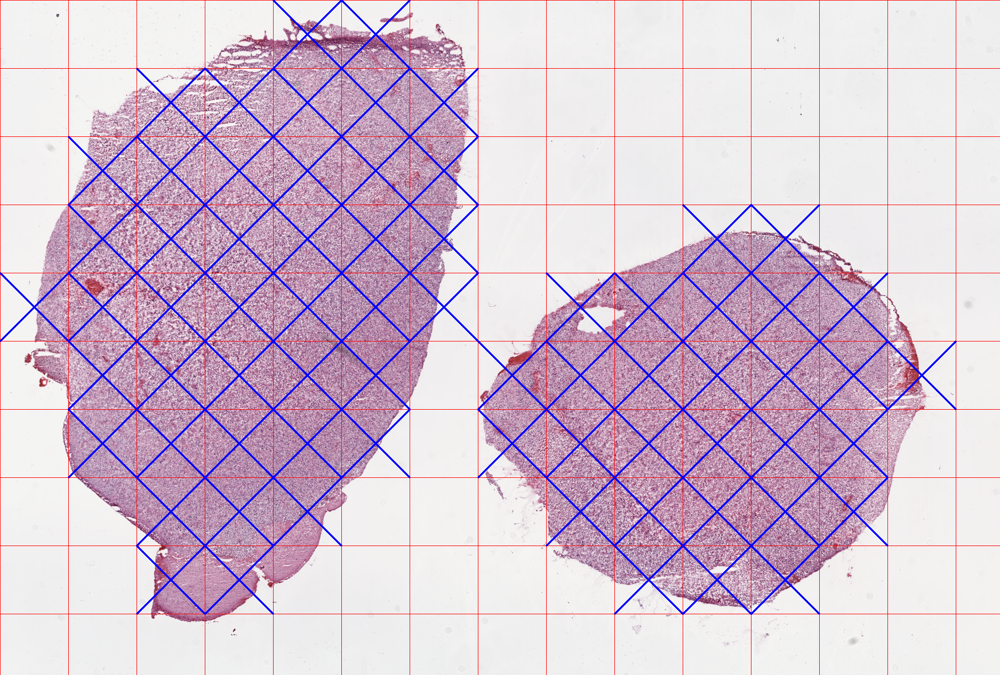

In [ ]:
im = Image.open("output/TCGA-76-4934-01A-01-TS1.37a9c5e6-3cb3-4d55-9091-bd3c510a8680/tilecrossed_TCGA-76-4934-01A-01-TS1.37a9c5e6-3cb3-4d55-9091-bd3c510a8680.png")
display(im)

One example of slide from breast tissue:

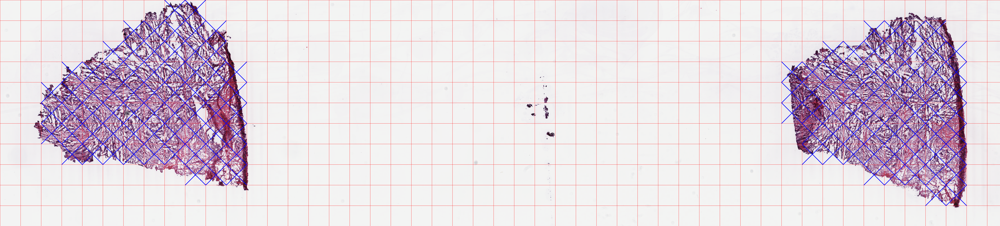

In [ ]:
im = Image.open('output/TCGA-A2-A04U-01A-01-BSA.65a9cf7d-8f03-45b6-8751-5a535db11426/tilecrossed_TCGA-A2-A04U-01A-01-BSA.65a9cf7d-8f03-45b6-8751-5a535db11426.png')
display(im)

### Preparing the data to train a convolutional neural network

PyHIST outputs log files for each image indicating which tiles were selected or not. We will read these files and merge them:

In [ ]:
# Change working directory to tutorial path
os.chdir(tutorial_path)

# First, we prepare the TCGA IDs to know which tissue belongs to each file
tmp = ids[["filename", "Tissue"]].copy()
tmp["filename"] = [x.replace(".svs", "") for x in ids["filename"].values]
tmp.set_index('filename', inplace=True)

# Traverse the log files
logs = []
for root, dirs, files in os.walk("output/"):
    for file in files:
        if file == "tile_selection.tsv":

            # Read log file
            x = pd.read_csv(os.path.join(root, file), sep = "\t")

            # Create a column with the filename
            x["filename"] = [y.split("_")[0] for y in x["Tile"].values]

            # Append the tissue information
            x = x.join(tmp, on = "filename", how = "left")
            logs.append(x)

# Concatenate all data frames
logs = pd.concat(logs)

# Keep data only for the selected tiles
logs = logs[logs['Keep'] == 1]
print(logs.shape)
logs.reset_index(inplace=True, drop=True)
logs.head()

(7163, 8)


,Tile,Width,Height,Keep,Row,Column,filename,Tissue
0,TCGA-A2-A04U-01A-01-BSA.65a9cf7d-8f03-45b6-875...,512,512,1,0,8,TCGA-A2-A04U-01A-01-BSA.65a9cf7d-8f03-45b6-875...,Breast
1,TCGA-A2-A04U-01A-01-BSA.65a9cf7d-8f03-45b6-875...,512,512,1,0,9,TCGA-A2-A04U-01A-01-BSA.65a9cf7d-8f03-45b6-875...,Breast
2,TCGA-A2-A04U-01A-01-BSA.65a9cf7d-8f03-45b6-875...,512,512,1,1,6,TCGA-A2-A04U-01A-01-BSA.65a9cf7d-8f03-45b6-875...,Breast
3,TCGA-A2-A04U-01A-01-BSA.65a9cf7d-8f03-45b6-875...,512,512,1,1,7,TCGA-A2-A04U-01A-01-BSA.65a9cf7d-8f03-45b6-875...,Breast
4,TCGA-A2-A04U-01A-01-BSA.65a9cf7d-8f03-45b6-875...,512,512,1,1,8,TCGA-A2-A04U-01A-01-BSA.65a9cf7d-8f03-45b6-875...,Breast


We will aim to get around 30% of the tiles from each tissue for the test set, and the remaining 70% for the training set. While performing this selection, it is desirable to keep the tiles of the same slide in a single set (i.e. all tiles from a slide should go to either the training or the test set). Therefore, from the 6 slides of each tissue, we will choose the slide with the closest number of tiles to 30% of the total tiles to be in the test set respectively, while the remaining slides will be left for training the model. The class imbalances will be fixed at the moment of performing data augmentation while training the model.

In [ ]:
# Get the filenames for the slides with the largest amount of tiles
slidecounts = logs.groupby(['filename', 'Tissue']).size().reset_index().sort_values(['Tissue', 0]).reset_index(drop=True)
slidecounts.rename({0:"counts"}, axis = 1, inplace=True)

# Calculate the percentage of the total tiles for each slide, within a tissue
slidecounts["percentage"] = slidecounts.groupby('Tissue').apply(lambda x: x['counts']/x['counts'].sum()).reset_index(drop=True)
slidecounts.set_index('filename', inplace=True)

# View a part of the tile distribution
slidecounts.head(n=10)

,Tissue,counts,percentage
filename,,,
TCGA-76-4934-01A-01-TS1.37a9c5e6-3cb3-4d55-9091-bd3c510a8680,Brain,69,0.051531
TCGA-76-6193-01A-01-TS1.3363a9fa-7731-4da9-9ef1-2c12f65e57bb,Brain,155,0.115758
TCGA-76-6660-01A-01-TS1.f4ee585a-0716-4726-89de-b7625c5c2eee,Brain,187,0.139656
TCGA-76-6664-01A-01-TS1.a0af28a0-15fc-476c-b329-31d78e473905,Brain,237,0.176998
TCGA-76-6663-01A-01-TS1.2486fda9-2f5d-4a2a-8990-18aced51fce3,Brain,311,0.232263
TCGA-76-6662-01A-01-TS1.95ae6f01-16c0-40f8-ae07-9a0eee5e0621,Brain,380,0.283794
TCGA-A2-A04U-01A-01-BSA.65a9cf7d-8f03-45b6-8751-5a535db11426,Breast,125,0.099920
TCGA-A2-A0D4-01A-01-BSA.0665ed7a-c8e2-4b8a-bf73-8c06dab48c47,Breast,133,0.106315
TCGA-A2-A0D0-01A-01-BSA.de3699b8-cd5b-4bac-af17-b63d447c55e7,Breast,165,0.131894


In [ ]:
# Within each tissue, choose the slide closest to 30% of the total number of
# tiles for the class to be used as test. The column "difference" will be
# used to pick the slide closest to 30%.
slidecounts["difference"] = abs(0.30 - slidecounts["percentage"])
test_ids = pd.DataFrame(slidecounts.groupby(["Tissue"])["difference"].nsmallest(1)).reset_index()
test_ids["dataset"] = "test"
test_ids

,Tissue,filename,difference,dataset
0,Brain,TCGA-76-6662-01A-01-TS1.95ae6f01-16c0-40f8-ae0...,0.016206,test
1,Breast,TCGA-A2-A0CS-01A-01-BSA.a932a854-ba6f-4a29-9fd...,0.043405,test
2,Colon,TCGA-G4-6320-01A-01-TS1.7af468e9-64f5-44f2-b65...,0.040608,test
3,Kidney,TCGA-CZ-5989-11A-01-TS1.3ce88a74-7a67-455b-9a2...,0.067338,test
4,Liver,TCGA-G3-AAV1-01A-01-TSA.22FE3767-C049-4D92-9D6...,0.001837,test
5,Skin,TCGA-D3-A1Q3-06A-01-TSA.00141EA8-3ABA-4A64-966...,0.021547,test


In [ ]:
# Generate a file with all the metadata
logs = logs.merge(test_ids[["filename", "dataset"]], how="left", on="filename")
logs["dataset"].fillna("train", inplace=True)
logs.sort_values(["dataset", "Tissue", "Tile"]).reset_index(drop=True, inplace=True)
logs.to_csv("output/metadata.tsv", sep = "\t", index = False)
logs.head()

,Tile,Width,Height,Keep,Row,Column,filename,Tissue,dataset
0,TCGA-A2-A04U-01A-01-BSA.65a9cf7d-8f03-45b6-875...,512,512,1,0,8,TCGA-A2-A04U-01A-01-BSA.65a9cf7d-8f03-45b6-875...,Breast,train
1,TCGA-A2-A04U-01A-01-BSA.65a9cf7d-8f03-45b6-875...,512,512,1,0,9,TCGA-A2-A04U-01A-01-BSA.65a9cf7d-8f03-45b6-875...,Breast,train
2,TCGA-A2-A04U-01A-01-BSA.65a9cf7d-8f03-45b6-875...,512,512,1,1,6,TCGA-A2-A04U-01A-01-BSA.65a9cf7d-8f03-45b6-875...,Breast,train
3,TCGA-A2-A04U-01A-01-BSA.65a9cf7d-8f03-45b6-875...,512,512,1,1,7,TCGA-A2-A04U-01A-01-BSA.65a9cf7d-8f03-45b6-875...,Breast,train
4,TCGA-A2-A04U-01A-01-BSA.65a9cf7d-8f03-45b6-875...,512,512,1,1,8,TCGA-A2-A04U-01A-01-BSA.65a9cf7d-8f03-45b6-875...,Breast,train


# The number of tiles in each set, per tissue, is:

In [ ]:
pd.crosstab(logs['Tissue'], logs['dataset'])

dataset,test,train
Tissue,,
Brain,380,959
Breast,321,930
Colon,290,828
Kidney,416,1372
Liver,230,532
Skin,252,653


In [ ]:
# In percentages:
pd.crosstab(logs['Tissue'], logs['dataset']).apply(lambda x: x/x.sum(), axis = 1)

dataset,test,train
Tissue,,
Brain,0.283794,0.716206
Breast,0.256595,0.743405
Colon,0.259392,0.740608
Kidney,0.232662,0.767338
Liver,0.301837,0.698163
Skin,0.278453,0.721547


We create 'train' and 'validation' folders with subfolders for each tissue:

In [ ]:
tissue_list = logs['Tissue'].unique()
sets = logs["dataset"].unique().tolist()

for s in sets:
    path = 'output/' + s + '/'

    if not os.path.exists(path):
        os.mkdir(path)
        for tissue in tissue_list:
            os.mkdir(path + tissue)

Move the tiles to their corresponding folders:

In [ ]:
for i in range(logs.shape[0]):
    current_tile = logs.iloc[i]
    tile_path = tutorial_path + "output/" + current_tile['filename'] + "/" + \
        current_tile['filename'] + "_tiles/" + current_tile['Tile'] + ".png"
    out_path = tutorial_path + "output/" + current_tile['dataset'] + "/" + \
        current_tile['Tissue'] + "/" + current_tile['Tile'] + ".png"

    os.replace(tile_path, out_path)

Remove the individual WSI folders:

In [ ]:
wsi_names = logs['filename'].unique()
for i in range(len(wsi_names)):
    fpath = tutorial_path + "output/" + wsi_names[i] + "/"

    try:
        shutil.rmtree(fpath)
    except OSError as e:
        print("Error: %s : %s" % (fpath, e.strerror))

Create a compressed file with all the output:

In [ ]:
%cd output
!tar -czf ../tcga_tiles.tar.gz .

/content/PyHIST/use_case/output


__In part B, we will train a CNN to classify the tiles into the six different types of tissue.__